<a href="https://colab.research.google.com/github/anand176/JackFruit__Ripeness-Detection-System/blob/master/Prediction1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

In [2]:
import tensorflow as tf

# Path to your model file
model_path = '/content/drive/MyDrive/jackfruit_ripeness.h5'

# Load the model
model = tf.keras.models.load_model(model_path)

In [4]:

import os
labels=[]
file_names=os.listdir('/content/drive/MyDrive/resized')
print(file_names)
for file in file_names:
    if file[0]=='r':

        labels.append(1)
    else:

        labels.append(0)

['ripe_0_1333.jpeg', 'ripe_0_1278.jpeg', 'ripe_0_1901.jpeg', 'ripe_0_1572.jpeg', 'ripe_0_1284.jpeg', 'ripe_0_1886.jpeg', 'ripe_0_1235.jpeg', 'ripe_0_1708.jpeg', 'ripe_0_1302.jpeg', 'ripe_0_1111.jpeg', 'ripe_0_1037.jpeg', 'ripe_0_1976.jpeg', 'ripe_0_1044.jpeg', 'ripe_0_1000.jpeg', 'ripe_0_2008.jpeg', 'ripe_0_1649.jpeg', 'ripe_0_1827.jpeg', 'ripe_0_1378.jpeg', 'ripe_0_1918.jpeg', 'ripe_0_1010.jpeg', 'ripe_0_1528.jpeg', 'ripe_0_1920.jpeg', 'ripe_0_1943.jpeg', 'ripe_0_1306.jpeg', 'ripe_0_2211.jpeg', 'ripe_0_1140.jpeg', 'ripe_0_117.jpeg', 'ripe_0_1339.jpeg', 'ripe_0_1975.jpeg', 'ripe_0_1630.jpeg', 'ripe_0_1752.jpeg', 'ripe_0_1567.jpeg', 'ripe_0_219.jpeg', 'ripe_0_1562.jpeg', 'ripe_0_1966.jpeg', 'ripe_0_1279.jpeg', 'ripe_0_1551.jpeg', 'ripe_0_1713.jpeg', 'ripe_0_2101.jpeg', 'ripe_0_1845.jpeg', 'ripe_0_206.jpeg', 'ripe_0_1755.jpeg', 'ripe_0_1162.jpeg', 'ripe_0_1351.jpeg', 'ripe_0_1523.jpeg', 'ripe_0_1928.jpeg', 'ripe_0_1961.jpeg', 'ripe_0_1370.jpeg', 'ripe_0_1536.jpeg', 'ripe_0_1895.jpeg', 'r

In [6]:
import cv2
import glob
import numpy as np
image_directory='/content/drive/MyDrive/resized/'
image_extension=['png','jpg']
files=[]
# matching_files = glob.glob(directory + '*.jpg')
print(files)
[files.extend(glob.glob(image_directory+'*.jpeg'))]
images_array=np.asarray([cv2.imread(file) for file in files])
print(type(images_array))
# print(images_array)
print(images_array.shape)

[]
<class 'numpy.ndarray'>
(904, 224, 224, 3)


In [7]:

X=images_array
Y=np.asarray(labels)

In [11]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=2)

In [12]:
X_train_scaled=X_train/255
X_test_scaled=X_test/255

In [13]:
score,acc=model.evaluate(X_test_scaled,Y_test)
print('test loss=',score)
print('test accuracy=',acc)

6/6 [==============================] - 7s 1s/step - loss: 0.6655 - accuracy: 0.9834
test loss= 0.6654833555221558
test accuracy= 0.9834254384040833


In [14]:
score,acc=model.evaluate(X_train_scaled,Y_train)
print('test loss=',score)
print('test accuracy=',acc)

23/23 [==============================] - 38s 2s/step - loss: 6.0946e-06 - accuracy: 1.0000
test loss= 6.094595391914481e-06
test accuracy= 1.0


path of img to be predicted:/content/istockphoto-1180785640-2048x2048.jpg


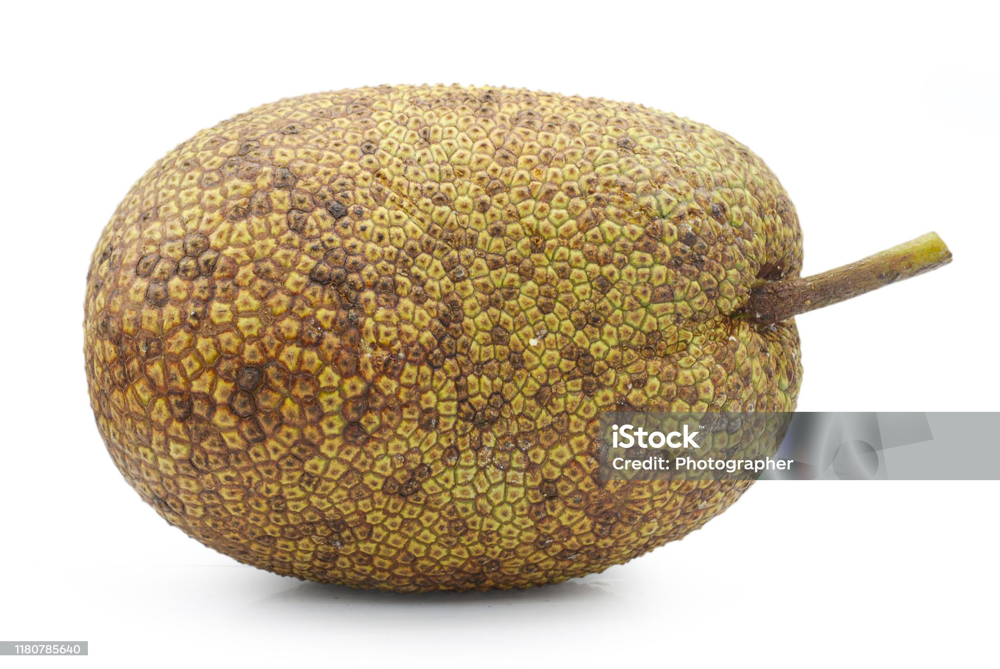

1/1 [==============================] - 0s 113ms/step
ripe


In [17]:
from google.colab.patches import cv2_imshow
import cv2
input_image_path=input('path of img to be predicted:')
input_image=cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize=cv2.resize(input_image,(224,224))
# print(input_image_resize)
input_image_scaled=input_image_resize/255
image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])
input_prediction=model.predict(image_reshaped)
# input_pred_label=np.argmax(input_prediction)
# print(input_pred_label)
# print(input_prediction)
# print(input_prediction[0][0])
if input_prediction[0][0]>.5:

  print('ripe')
else:
  print('unripe')

path of img to be predicted:/content/IMG_20200617_095250.jpg


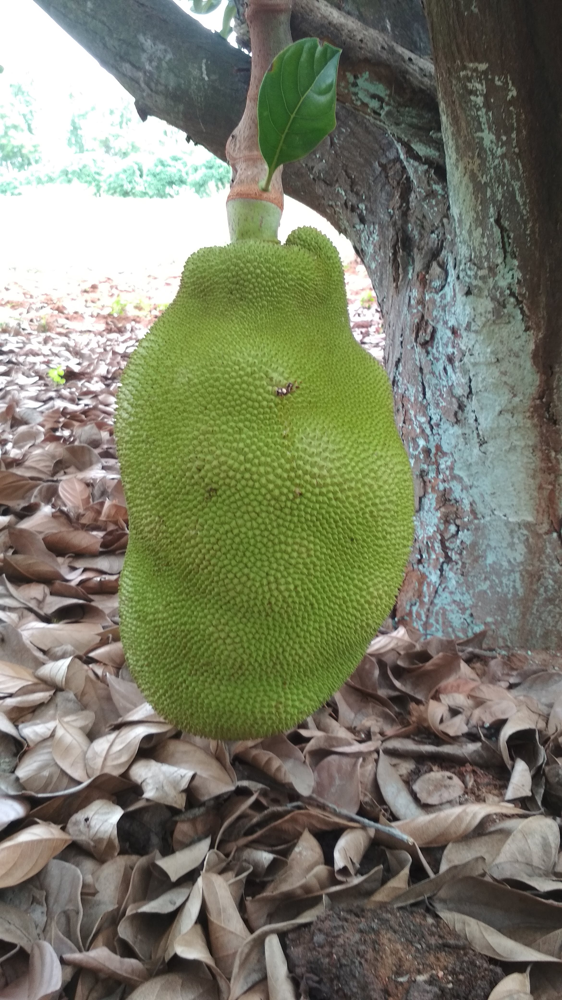

1/1 [==============================] - 0s 125ms/step
unripe


In [18]:
from google.colab.patches import cv2_imshow
import cv2
input_image_path=input('path of img to be predicted:')
input_image=cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize=cv2.resize(input_image,(224,224))
# print(input_image_resize)
input_image_scaled=input_image_resize/255
image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])
input_prediction=model.predict(image_reshaped)
# input_pred_label=np.argmax(input_prediction)
# print(input_pred_label)
# print(input_prediction)
# print(input_prediction[0][0])
if input_prediction[0][0]>.5:

  print('ripe')
else:
  print('unripe')